In [1]:
import os
import torch
import torchvision
import numpy as np
import pandas as pd
import torch.nn as nn
from torch import optim
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torchvision.models as models
from torchvision import datasets, transforms
from torch.autograd import grad as torch_grad
from torch.utils.data import ConcatDataset, DataLoader, Subset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [2]:
transform = transforms.Compose([transforms.Resize((64, 64)), 
                                transforms.ToTensor(), 
                                transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)]) 

dataset = datasets.ImageFolder(
    root='/kaggle/input/datasets/soumikrakshit/anime-faces/data', 
    transform=transform) 

batch_size = 64

loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [3]:
len(loader)

336

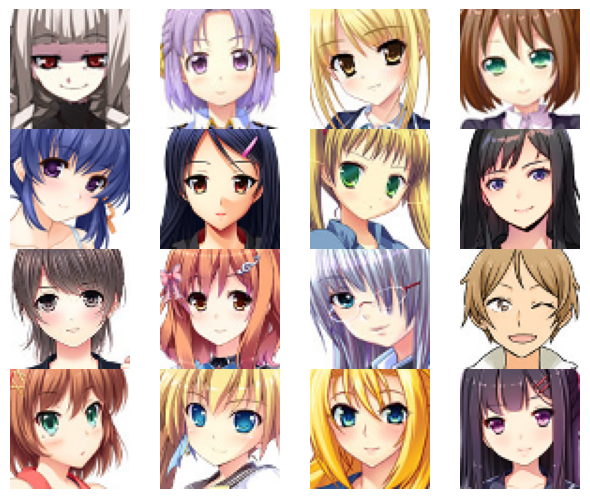

In [4]:
for image, label in loader:
    fig, ax = plt.subplots(4, 4)

    for i, ax in enumerate(ax.flat):
        img = image[i]

        img = img * 0.5 + 0.5
        img = img.numpy()

        ax.imshow(np.transpose(img, (1,2,0)))
        ax.axis(False)
    break

plt.subplots_adjust(left=0, right=1, top=1, bottom=0,
                    wspace=0, hspace=0)
plt.tight_layout(pad=0)
plt.show()

In [5]:
class Generator_GP(nn.Module):
    def __init__(self, img_size, latent_dim, dim):
        super(Generator_GP, self).__init__()

        self.dim = dim
        self.latent_dim = latent_dim
        self.img_size = img_size
        self.feature_sizes = (self.img_size[1]//16, self.img_size[2]//16)

        self.latent_to_features = nn.Sequential(
            nn.Linear(latent_dim, 8*dim*self.feature_sizes[0]*self.feature_sizes[1]),
            nn.ReLU()
        )

        self.features_to_image = nn.Sequential(
            nn.ConvTranspose2d(8*dim, 4*dim, 4,2,1),
            nn.BatchNorm2d(4*dim),
            nn.ReLU(),
            nn.ConvTranspose2d(4*dim, 2*dim, 4,2,1),
            nn.BatchNorm2d(2*dim),
            nn.ReLU(),
            nn.ConvTranspose2d(2*dim, dim, 4,2,1),
            nn.BatchNorm2d(dim),
            nn.ReLU(),
            nn.ConvTranspose2d(dim, self.img_size[0], 4,2,1),
            nn.Tanh()
        )

    def forward(self, input_data):
        input_data.to(device)
        x = self.latent_to_features(input_data)
        x = x.view(-1, 8*self.dim, self.feature_sizes[0], self.feature_sizes[1])
        return self.features_to_image(x)

    def sample_latent(self, num_samples):
        return torch.randn((num_samples, self.latent_dim))

class Discriminator_GP(nn.Module):
    def __init__(self, img_size, dim):
        super(Discriminator_GP, self).__init__()

        self.img_size = img_size

        self.image_to_features = nn.Sequential(
            nn.Conv2d(self.img_size[0], dim, 4,2,1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(dim, 2*dim, 4,2,1),
            nn.InstanceNorm2d(2*dim, affine=True), 
            nn.LeakyReLU(0.2),
            nn.Conv2d(2*dim, 4*dim, 4,2,1),
            nn.InstanceNorm2d(4*dim, affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(4*dim, 8*dim, 4,2,1),
            nn.InstanceNorm2d(8*dim, affine=True),
            nn.LeakyReLU(0.2),                       
        )

        output_size = 8*dim*(img_size[1]//16)*(img_size[2]//16)
        self.features_to_prob = nn.Sequential(
            nn.Linear(output_size, 1),
        )

    def forward(self, input_data):
        batch_size = input_data.size()[0]
        x = self.image_to_features(input_data)
        x = x.view(batch_size, -1)
        return self.features_to_prob(x)

def gradient_penalty_loss(real_data, gen_data, discriminator, gp_weight=10, device=device):
    batch_size = real_data.size(0)

    alpha = torch.rand(batch_size, 1, 1, 1, device=device)
    alpha = alpha.expand_as(real_data)

    interpolated = alpha * real_data + (1 - alpha) * gen_data
    interpolated.requires_grad_(True)

    prob_interpolated = discriminator(interpolated)

    gradients = torch.autograd.grad(
        outputs=prob_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(prob_interpolated),
        create_graph=True,
        retain_graph=True)[0]

    gradients = gradients.view(batch_size, -1)
    gradient_norm = gradients.norm(2, dim=1)
    gradient_penalty = ((gradient_norm - 1) ** 2).mean()

    return gp_weight * gradient_penalty, gradient_norm.mean()

In [54]:
G_lr = 0.0001
D_lr = 0.00005

betas = (0.0, 0.9)

gp_weight = 50

img_size = (3, 64, 64)
latent_dim = 100
dim = 64

generator = Generator_GP(img_size=img_size, latent_dim=latent_dim, dim=dim)
discriminator = Discriminator_GP(img_size=img_size, dim=dim)

G_optimizer = optim.Adam(generator.parameters(), lr=G_lr, betas=betas)
D_optimizer = optim.Adam(discriminator.parameters(), lr=D_lr, betas=betas)

generator = generator.to(device)
discriminator = discriminator.to(device)

In [55]:
real_img, _ = next(iter(loader))
real_img = real_img.to(device)

z = torch.randn(batch_size, latent_dim, device=device)
fake_img = generator(z)
print(f"Generator output shape : {fake_img.shape}")

score = discriminator(fake_img)
print(f"Discriminator output shape : {score.shape}")

gp, gn = gradient_penalty_loss(real_img, fake_img, discriminator)
print(f"Gradient penalty : {gp.item():.4f}")
print(f"Gradient norm : {gn.item():.4f}")

Generator output shape : torch.Size([64, 3, 64, 64])
Discriminator output shape : torch.Size([64, 1])
Gradient penalty : 3.6836
Gradient norm : 1.5641


In [56]:
G_loss_total = []
D_loss_total = []
Grad_pen_total = []
Grad_norm_total = []

os.makedirs("progress", exist_ok=True)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 1/30 | Iter 48 /336 | D_loss -16.5607 | G_loss 6.7974 | Gradient_Penalty 2.2853 | Gradient_Norm 1.1696 | 
Epoch 1/30 | Iter 96 /336 | D_loss -16.4893 | G_loss 9.1254 | Gradient_Penalty 2.1367 | Gradient_Norm 1.1714 | 
Epoch 1/30 | Iter 144/336 | D_loss -9.3041 | G_loss 3.5933 | Gradient_Penalty 0.3511 | Gradient_Norm 1.0050 | 
Epoch 1/30 | Iter 192/336 | D_loss -12.5048 | G_loss 5.4773 | Gradient_Penalty 1.4210 | Gradient_Norm 1.1035 | 
Epoch 1/30 | Iter 240/336 | D_loss -13.9368 | G_loss 8.4293 | Gradient_Penalty 1.2489 | Gradient_Norm 1.1175 | 
Epoch 1/30 | Iter 288/336 | D_loss -11.8331 | G_loss 5.7414 | Gradient_Penalty 0.4577 | Gradient_Norm 1.0395 | 
Epoch 1/30 | Iter 336/336 | D_loss -12.6458 | G_loss 3.6346 | Gradient_Penalty 1.2998 | Gradient_Norm 1.1273 | 


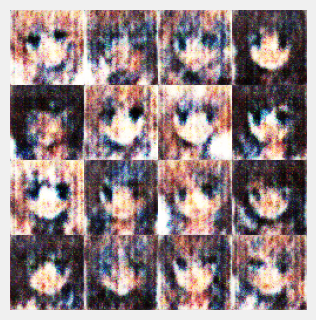

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 2/30 | Iter 48 /336 | D_loss -10.9425 | G_loss 9.0198 | Gradient_Penalty 1.9493 | Gradient_Norm 1.1659 | 
Epoch 2/30 | Iter 96 /336 | D_loss -11.3299 | G_loss 8.7606 | Gradient_Penalty 0.5930 | Gradient_Norm 1.0741 | 
Epoch 2/30 | Iter 144/336 | D_loss -9.8260 | G_loss 8.9805 | Gradient_Penalty 0.3321 | Gradient_Norm 1.0051 | 
Epoch 2/30 | Iter 192/336 | D_loss -9.4693 | G_loss 7.6586 | Gradient_Penalty 0.4182 | Gradient_Norm 1.0069 | 
Epoch 2/30 | Iter 240/336 | D_loss -9.6613 | G_loss 8.9102 | Gradient_Penalty 0.6019 | Gradient_Norm 1.0610 | 
Epoch 2/30 | Iter 288/336 | D_loss -8.9488 | G_loss 4.9630 | Gradient_Penalty 1.2425 | Gradient_Norm 1.1067 | 
Epoch 2/30 | Iter 336/336 | D_loss -7.8748 | G_loss 5.6549 | Gradient_Penalty 0.5627 | Gradient_Norm 1.0761 | 


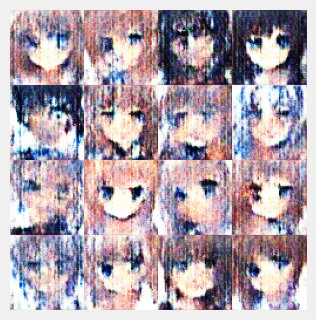

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 3/30 | Iter 48 /336 | D_loss -9.3659 | G_loss 7.8113 | Gradient_Penalty 0.4302 | Gradient_Norm 1.0670 | 
Epoch 3/30 | Iter 96 /336 | D_loss -8.9225 | G_loss 7.6219 | Gradient_Penalty 0.6218 | Gradient_Norm 1.0755 | 
Epoch 3/30 | Iter 144/336 | D_loss -7.7108 | G_loss 8.4553 | Gradient_Penalty 0.8937 | Gradient_Norm 1.1054 | 
Epoch 3/30 | Iter 192/336 | D_loss -8.8196 | G_loss 5.7137 | Gradient_Penalty 0.7324 | Gradient_Norm 1.0955 | 
Epoch 3/30 | Iter 240/336 | D_loss -8.2330 | G_loss 7.9036 | Gradient_Penalty 0.5511 | Gradient_Norm 1.0760 | 
Epoch 3/30 | Iter 288/336 | D_loss -7.7344 | G_loss 5.9815 | Gradient_Penalty 0.9099 | Gradient_Norm 1.1065 | 
Epoch 3/30 | Iter 336/336 | D_loss -7.4827 | G_loss 7.7577 | Gradient_Penalty 0.5901 | Gradient_Norm 1.0649 | 


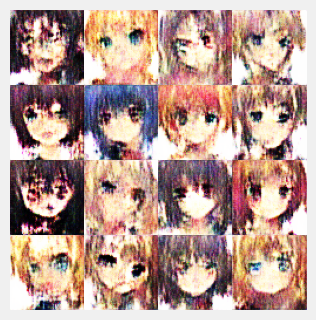

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 4/30 | Iter 48 /336 | D_loss -8.4466 | G_loss 7.0361 | Gradient_Penalty 0.5176 | Gradient_Norm 1.0544 | 
Epoch 4/30 | Iter 96 /336 | D_loss -8.4454 | G_loss 7.2200 | Gradient_Penalty 0.3657 | Gradient_Norm 1.0491 | 
Epoch 4/30 | Iter 144/336 | D_loss -8.2289 | G_loss 7.2713 | Gradient_Penalty 0.7118 | Gradient_Norm 1.0893 | 
Epoch 4/30 | Iter 192/336 | D_loss -9.1950 | G_loss 5.3626 | Gradient_Penalty 0.5087 | Gradient_Norm 1.0754 | 
Epoch 4/30 | Iter 240/336 | D_loss -8.3032 | G_loss 5.8177 | Gradient_Penalty 0.5221 | Gradient_Norm 1.0549 | 
Epoch 4/30 | Iter 288/336 | D_loss -8.5843 | G_loss 7.0776 | Gradient_Penalty 1.2015 | Gradient_Norm 1.1366 | 
Epoch 4/30 | Iter 336/336 | D_loss -7.7240 | G_loss 5.7365 | Gradient_Penalty 0.7977 | Gradient_Norm 1.0845 | 


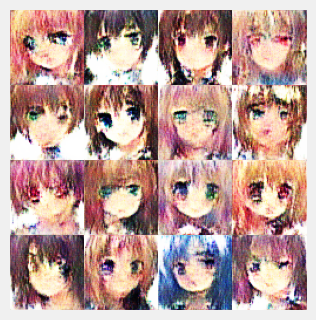

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 5/30 | Iter 48 /336 | D_loss -8.8690 | G_loss 8.4149 | Gradient_Penalty 0.2285 | Gradient_Norm 1.0187 | 
Epoch 5/30 | Iter 96 /336 | D_loss -7.4378 | G_loss 6.0825 | Gradient_Penalty 1.0951 | Gradient_Norm 1.1093 | 
Epoch 5/30 | Iter 144/336 | D_loss -8.1549 | G_loss 6.8181 | Gradient_Penalty 0.3894 | Gradient_Norm 1.0196 | 
Epoch 5/30 | Iter 192/336 | D_loss -8.2459 | G_loss 5.7072 | Gradient_Penalty 1.1628 | Gradient_Norm 1.1179 | 
Epoch 5/30 | Iter 240/336 | D_loss -9.0438 | G_loss 5.0611 | Gradient_Penalty 0.8377 | Gradient_Norm 1.1080 | 
Epoch 5/30 | Iter 288/336 | D_loss -8.0138 | G_loss 5.3848 | Gradient_Penalty 1.5388 | Gradient_Norm 1.1561 | 
Epoch 5/30 | Iter 336/336 | D_loss -8.3127 | G_loss 5.5110 | Gradient_Penalty 0.3124 | Gradient_Norm 1.0232 | 


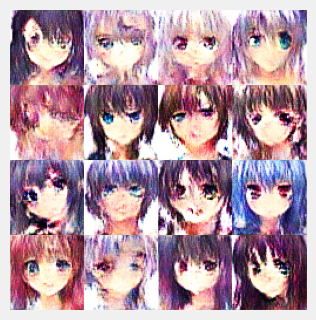

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 6/30 | Iter 48 /336 | D_loss -8.5199 | G_loss 7.8156 | Gradient_Penalty 0.9214 | Gradient_Norm 1.1020 | 
Epoch 6/30 | Iter 96 /336 | D_loss -8.7547 | G_loss 5.7111 | Gradient_Penalty 0.6648 | Gradient_Norm 1.0695 | 
Epoch 6/30 | Iter 144/336 | D_loss -9.9151 | G_loss 2.2299 | Gradient_Penalty 0.8910 | Gradient_Norm 1.0884 | 
Epoch 6/30 | Iter 192/336 | D_loss -7.9077 | G_loss 5.2093 | Gradient_Penalty 1.1791 | Gradient_Norm 1.1268 | 
Epoch 6/30 | Iter 240/336 | D_loss -8.0165 | G_loss 5.9248 | Gradient_Penalty 1.2194 | Gradient_Norm 1.1378 | 
Epoch 6/30 | Iter 288/336 | D_loss -8.4503 | G_loss 5.6471 | Gradient_Penalty 1.0985 | Gradient_Norm 1.1203 | 
Epoch 6/30 | Iter 336/336 | D_loss -8.2622 | G_loss 4.4285 | Gradient_Penalty 0.4991 | Gradient_Norm 1.0696 | 


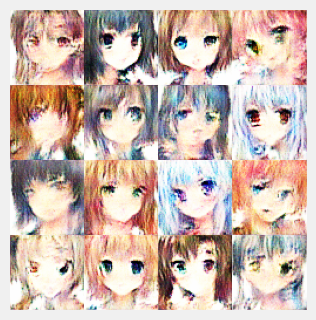

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 7/30 | Iter 48 /336 | D_loss -7.5495 | G_loss 2.5295 | Gradient_Penalty 0.9452 | Gradient_Norm 1.1100 | 
Epoch 7/30 | Iter 96 /336 | D_loss -8.0089 | G_loss 6.0720 | Gradient_Penalty 0.2936 | Gradient_Norm 1.0353 | 
Epoch 7/30 | Iter 144/336 | D_loss -8.1010 | G_loss 2.4019 | Gradient_Penalty 0.2955 | Gradient_Norm 1.0489 | 
Epoch 7/30 | Iter 192/336 | D_loss -7.6102 | G_loss 3.4415 | Gradient_Penalty 0.4992 | Gradient_Norm 1.0563 | 
Epoch 7/30 | Iter 240/336 | D_loss -7.8048 | G_loss 2.1140 | Gradient_Penalty 0.3243 | Gradient_Norm 1.0273 | 
Epoch 7/30 | Iter 288/336 | D_loss -7.8723 | G_loss 2.6987 | Gradient_Penalty 0.2820 | Gradient_Norm 1.0351 | 
Epoch 7/30 | Iter 336/336 | D_loss -8.7290 | G_loss 3.2615 | Gradient_Penalty 0.5712 | Gradient_Norm 1.0589 | 


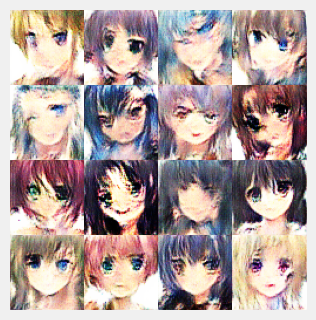

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 8/30 | Iter 48 /336 | D_loss -8.1679 | G_loss 3.5279 | Gradient_Penalty 1.3101 | Gradient_Norm 1.1333 | 
Epoch 8/30 | Iter 96 /336 | D_loss -7.5335 | G_loss 4.2533 | Gradient_Penalty 0.9552 | Gradient_Norm 1.1062 | 
Epoch 8/30 | Iter 144/336 | D_loss -8.8510 | G_loss 1.6426 | Gradient_Penalty 0.8253 | Gradient_Norm 1.1031 | 
Epoch 8/30 | Iter 192/336 | D_loss -8.1337 | G_loss 4.1461 | Gradient_Penalty 0.7788 | Gradient_Norm 1.0993 | 
Epoch 8/30 | Iter 240/336 | D_loss -7.8696 | G_loss 3.0016 | Gradient_Penalty 0.8332 | Gradient_Norm 1.1043 | 
Epoch 8/30 | Iter 288/336 | D_loss -8.9219 | G_loss 3.9226 | Gradient_Penalty 0.9368 | Gradient_Norm 1.1082 | 
Epoch 8/30 | Iter 336/336 | D_loss -8.3813 | G_loss 1.8202 | Gradient_Penalty 0.7265 | Gradient_Norm 1.0861 | 


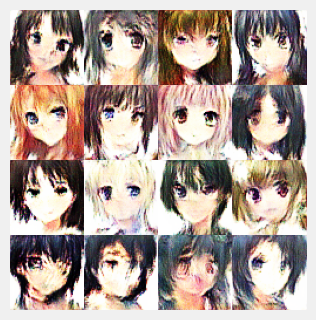

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 9/30 | Iter 48 /336 | D_loss -8.1059 | G_loss 4.8082 | Gradient_Penalty 1.1076 | Gradient_Norm 1.1161 | 
Epoch 9/30 | Iter 96 /336 | D_loss -7.8341 | G_loss 1.8012 | Gradient_Penalty 0.6174 | Gradient_Norm 1.0815 | 
Epoch 9/30 | Iter 144/336 | D_loss -8.1644 | G_loss 1.3219 | Gradient_Penalty 0.2523 | Gradient_Norm 1.0264 | 
Epoch 9/30 | Iter 192/336 | D_loss -8.2876 | G_loss 2.1603 | Gradient_Penalty 0.4997 | Gradient_Norm 1.0600 | 
Epoch 9/30 | Iter 240/336 | D_loss -8.4759 | G_loss 1.4712 | Gradient_Penalty 1.1569 | Gradient_Norm 1.1115 | 
Epoch 9/30 | Iter 288/336 | D_loss -7.8138 | G_loss 3.8731 | Gradient_Penalty 0.3428 | Gradient_Norm 1.0536 | 
Epoch 9/30 | Iter 336/336 | D_loss -7.4908 | G_loss 3.2998 | Gradient_Penalty 0.6904 | Gradient_Norm 1.0681 | 


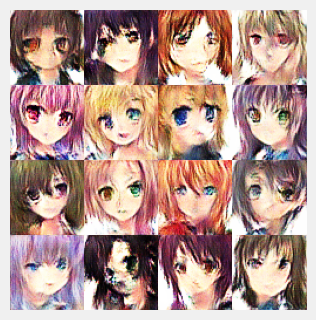

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 10/30 | Iter 48 /336 | D_loss -7.9725 | G_loss 5.4613 | Gradient_Penalty 0.7161 | Gradient_Norm 1.0667 | 
Epoch 10/30 | Iter 96 /336 | D_loss -8.2537 | G_loss 1.3107 | Gradient_Penalty 1.0215 | Gradient_Norm 1.1127 | 
Epoch 10/30 | Iter 144/336 | D_loss -7.3926 | G_loss 4.9478 | Gradient_Penalty 1.2859 | Gradient_Norm 1.1275 | 
Epoch 10/30 | Iter 192/336 | D_loss -7.7906 | G_loss 0.8640 | Gradient_Penalty 0.8585 | Gradient_Norm 1.0957 | 
Epoch 10/30 | Iter 240/336 | D_loss -7.9284 | G_loss 4.9436 | Gradient_Penalty 0.9731 | Gradient_Norm 1.1164 | 
Epoch 10/30 | Iter 288/336 | D_loss -7.7634 | G_loss 2.6134 | Gradient_Penalty 1.3494 | Gradient_Norm 1.1113 | 
Epoch 10/30 | Iter 336/336 | D_loss -7.7429 | G_loss 3.6480 | Gradient_Penalty 0.8046 | Gradient_Norm 1.1055 | 


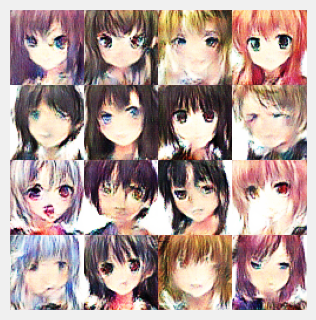

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 11/30 | Iter 48 /336 | D_loss -7.5988 | G_loss 3.9077 | Gradient_Penalty 1.3998 | Gradient_Norm 1.1376 | 
Epoch 11/30 | Iter 96 /336 | D_loss -8.3282 | G_loss 3.3614 | Gradient_Penalty 0.6238 | Gradient_Norm 1.0631 | 
Epoch 11/30 | Iter 144/336 | D_loss -8.9429 | G_loss 1.6385 | Gradient_Penalty 0.6532 | Gradient_Norm 1.0754 | 
Epoch 11/30 | Iter 192/336 | D_loss -7.6152 | G_loss 5.1459 | Gradient_Penalty 0.6982 | Gradient_Norm 1.0913 | 
Epoch 11/30 | Iter 240/336 | D_loss -8.3158 | G_loss 4.2752 | Gradient_Penalty 0.8941 | Gradient_Norm 1.1074 | 
Epoch 11/30 | Iter 288/336 | D_loss -7.9407 | G_loss 3.7488 | Gradient_Penalty 0.9360 | Gradient_Norm 1.1122 | 
Epoch 11/30 | Iter 336/336 | D_loss -8.1674 | G_loss 4.4140 | Gradient_Penalty 0.7805 | Gradient_Norm 1.0871 | 


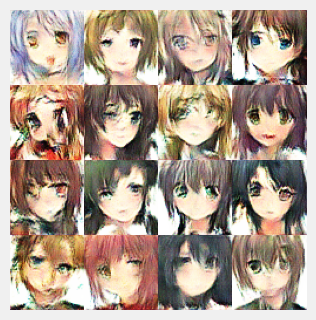

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 12/30 | Iter 48 /336 | D_loss -8.5167 | G_loss 4.8098 | Gradient_Penalty 1.0956 | Gradient_Norm 1.1062 | 
Epoch 12/30 | Iter 96 /336 | D_loss -8.5910 | G_loss 5.2069 | Gradient_Penalty 0.6324 | Gradient_Norm 1.0758 | 
Epoch 12/30 | Iter 144/336 | D_loss -8.2845 | G_loss 5.0892 | Gradient_Penalty 0.7905 | Gradient_Norm 1.0962 | 
Epoch 12/30 | Iter 192/336 | D_loss -7.6977 | G_loss 4.2597 | Gradient_Penalty 0.6140 | Gradient_Norm 1.0742 | 
Epoch 12/30 | Iter 240/336 | D_loss -8.6335 | G_loss 5.0197 | Gradient_Penalty 1.1012 | Gradient_Norm 1.1220 | 
Epoch 12/30 | Iter 288/336 | D_loss -9.3530 | G_loss -1.9872 | Gradient_Penalty 0.5630 | Gradient_Norm 1.0353 | 
Epoch 12/30 | Iter 336/336 | D_loss -7.9009 | G_loss 3.3500 | Gradient_Penalty 0.5891 | Gradient_Norm 1.0825 | 


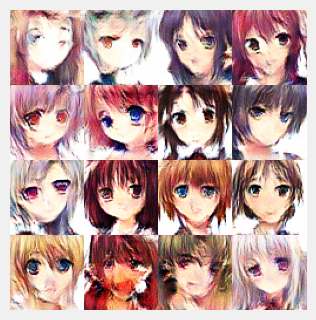

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 13/30 | Iter 48 /336 | D_loss -8.7483 | G_loss 5.9132 | Gradient_Penalty 0.7390 | Gradient_Norm 1.0614 | 
Epoch 13/30 | Iter 96 /336 | D_loss -8.5806 | G_loss 6.8549 | Gradient_Penalty 1.0529 | Gradient_Norm 1.1206 | 
Epoch 13/30 | Iter 144/336 | D_loss -7.8952 | G_loss 3.7460 | Gradient_Penalty 1.0840 | Gradient_Norm 1.1061 | 
Epoch 13/30 | Iter 192/336 | D_loss -8.4128 | G_loss 2.6164 | Gradient_Penalty 0.7201 | Gradient_Norm 1.0799 | 
Epoch 13/30 | Iter 240/336 | D_loss -8.4419 | G_loss 3.4907 | Gradient_Penalty 0.5399 | Gradient_Norm 1.0721 | 
Epoch 13/30 | Iter 288/336 | D_loss -8.5430 | G_loss 5.5544 | Gradient_Penalty 0.9202 | Gradient_Norm 1.1002 | 
Epoch 13/30 | Iter 336/336 | D_loss -9.0086 | G_loss 1.9882 | Gradient_Penalty 1.0668 | Gradient_Norm 1.1072 | 


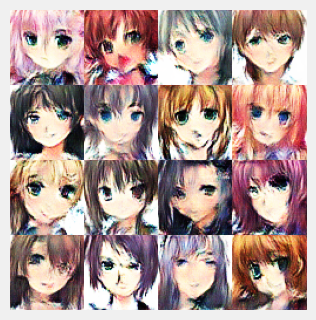

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 14/30 | Iter 48 /336 | D_loss -8.9565 | G_loss 4.7932 | Gradient_Penalty 2.0587 | Gradient_Norm 1.1513 | 
Epoch 14/30 | Iter 96 /336 | D_loss -8.6433 | G_loss 3.6269 | Gradient_Penalty 0.6607 | Gradient_Norm 1.0681 | 
Epoch 14/30 | Iter 144/336 | D_loss -8.8239 | G_loss 1.7318 | Gradient_Penalty 0.9450 | Gradient_Norm 1.0957 | 
Epoch 14/30 | Iter 192/336 | D_loss -8.2698 | G_loss 4.1708 | Gradient_Penalty 0.5050 | Gradient_Norm 1.0601 | 
Epoch 14/30 | Iter 240/336 | D_loss -8.6725 | G_loss 3.6025 | Gradient_Penalty 0.9612 | Gradient_Norm 1.0963 | 
Epoch 14/30 | Iter 288/336 | D_loss -8.2028 | G_loss 4.7539 | Gradient_Penalty 0.4770 | Gradient_Norm 1.0433 | 
Epoch 14/30 | Iter 336/336 | D_loss -7.8415 | G_loss 3.0521 | Gradient_Penalty 0.8363 | Gradient_Norm 1.0796 | 


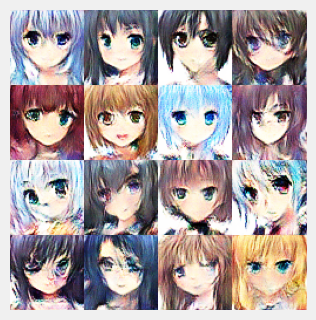

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 15/30 | Iter 48 /336 | D_loss -9.0370 | G_loss 2.6799 | Gradient_Penalty 1.1427 | Gradient_Norm 1.0987 | 
Epoch 15/30 | Iter 96 /336 | D_loss -8.6904 | G_loss 4.5828 | Gradient_Penalty 0.7639 | Gradient_Norm 1.0855 | 
Epoch 15/30 | Iter 144/336 | D_loss -8.9597 | G_loss 6.7958 | Gradient_Penalty 0.9247 | Gradient_Norm 1.0850 | 
Epoch 15/30 | Iter 192/336 | D_loss -7.0202 | G_loss 3.7390 | Gradient_Penalty 0.9017 | Gradient_Norm 1.0806 | 
Epoch 15/30 | Iter 240/336 | D_loss -8.7604 | G_loss 5.3909 | Gradient_Penalty 0.7021 | Gradient_Norm 1.0801 | 
Epoch 15/30 | Iter 288/336 | D_loss -8.9273 | G_loss 1.8981 | Gradient_Penalty 0.7189 | Gradient_Norm 1.0818 | 
Epoch 15/30 | Iter 336/336 | D_loss -9.4516 | G_loss 3.5004 | Gradient_Penalty 1.1654 | Gradient_Norm 1.1136 | 


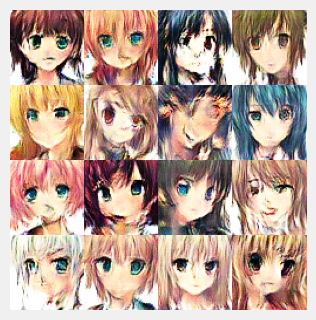

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 16/30 | Iter 48 /336 | D_loss -8.7446 | G_loss 7.0192 | Gradient_Penalty 1.4094 | Gradient_Norm 1.1288 | 
Epoch 16/30 | Iter 96 /336 | D_loss -8.7914 | G_loss 5.0896 | Gradient_Penalty 1.3393 | Gradient_Norm 1.1150 | 
Epoch 16/30 | Iter 144/336 | D_loss -8.6535 | G_loss 4.0393 | Gradient_Penalty 1.0207 | Gradient_Norm 1.0890 | 
Epoch 16/30 | Iter 192/336 | D_loss -8.3985 | G_loss 4.9190 | Gradient_Penalty 0.8762 | Gradient_Norm 1.0784 | 
Epoch 16/30 | Iter 240/336 | D_loss -8.4999 | G_loss 8.2604 | Gradient_Penalty 1.0541 | Gradient_Norm 1.1142 | 
Epoch 16/30 | Iter 288/336 | D_loss -8.8600 | G_loss 2.4960 | Gradient_Penalty 1.5705 | Gradient_Norm 1.1326 | 
Epoch 16/30 | Iter 336/336 | D_loss -9.0671 | G_loss 2.4746 | Gradient_Penalty 1.0643 | Gradient_Norm 1.1136 | 


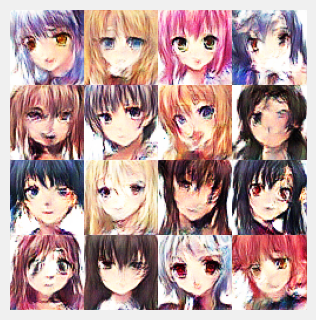

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 17/30 | Iter 48 /336 | D_loss -9.2945 | G_loss 6.3012 | Gradient_Penalty 1.4135 | Gradient_Norm 1.1220 | 
Epoch 17/30 | Iter 96 /336 | D_loss -8.0876 | G_loss 6.3562 | Gradient_Penalty 1.1134 | Gradient_Norm 1.1056 | 
Epoch 17/30 | Iter 144/336 | D_loss -8.9115 | G_loss 3.8994 | Gradient_Penalty 0.4731 | Gradient_Norm 1.0472 | 
Epoch 17/30 | Iter 192/336 | D_loss -8.5680 | G_loss 2.9070 | Gradient_Penalty 0.5537 | Gradient_Norm 1.0279 | 
Epoch 17/30 | Iter 240/336 | D_loss -8.6253 | G_loss 4.8815 | Gradient_Penalty 0.4067 | Gradient_Norm 1.0306 | 
Epoch 17/30 | Iter 288/336 | D_loss -8.6752 | G_loss 4.8014 | Gradient_Penalty 0.9408 | Gradient_Norm 1.0927 | 
Epoch 17/30 | Iter 336/336 | D_loss -8.4302 | G_loss 4.6565 | Gradient_Penalty 0.2857 | Gradient_Norm 1.0219 | 


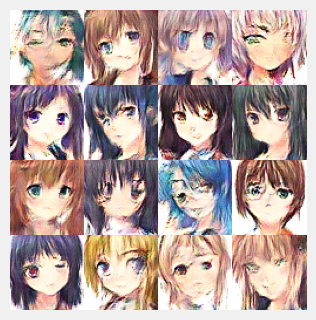

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 18/30 | Iter 48 /336 | D_loss -9.3059 | G_loss 5.7825 | Gradient_Penalty 1.0964 | Gradient_Norm 1.1061 | 
Epoch 18/30 | Iter 96 /336 | D_loss -8.3819 | G_loss 5.0402 | Gradient_Penalty 0.6521 | Gradient_Norm 1.0668 | 
Epoch 18/30 | Iter 144/336 | D_loss -8.8501 | G_loss 6.7867 | Gradient_Penalty 0.5692 | Gradient_Norm 1.0707 | 
Epoch 18/30 | Iter 192/336 | D_loss -8.5573 | G_loss 4.3739 | Gradient_Penalty 0.5477 | Gradient_Norm 1.0684 | 
Epoch 18/30 | Iter 240/336 | D_loss -8.6096 | G_loss 4.0989 | Gradient_Penalty 0.5329 | Gradient_Norm 1.0424 | 
Epoch 18/30 | Iter 288/336 | D_loss -8.9287 | G_loss 5.8205 | Gradient_Penalty 0.9879 | Gradient_Norm 1.1138 | 
Epoch 18/30 | Iter 336/336 | D_loss -8.9943 | G_loss 7.4122 | Gradient_Penalty 0.4487 | Gradient_Norm 1.0619 | 


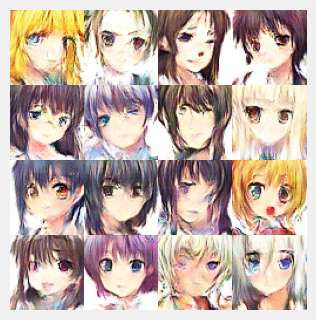

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 19/30 | Iter 48 /336 | D_loss -10.2888 | G_loss 6.8357 | Gradient_Penalty 1.1537 | Gradient_Norm 1.1093 | 
Epoch 19/30 | Iter 96 /336 | D_loss -9.4801 | G_loss 6.3514 | Gradient_Penalty 0.9555 | Gradient_Norm 1.1015 | 
Epoch 19/30 | Iter 144/336 | D_loss -9.0210 | G_loss 7.5668 | Gradient_Penalty 0.9835 | Gradient_Norm 1.0867 | 
Epoch 19/30 | Iter 192/336 | D_loss -8.9504 | G_loss 6.9848 | Gradient_Penalty 0.7920 | Gradient_Norm 1.0904 | 
Epoch 19/30 | Iter 240/336 | D_loss -8.5489 | G_loss 6.3210 | Gradient_Penalty 0.5053 | Gradient_Norm 1.0654 | 
Epoch 19/30 | Iter 288/336 | D_loss -8.7118 | G_loss 2.7278 | Gradient_Penalty 0.5890 | Gradient_Norm 1.0637 | 
Epoch 19/30 | Iter 336/336 | D_loss -9.2695 | G_loss 4.3209 | Gradient_Penalty 0.6185 | Gradient_Norm 1.0702 | 


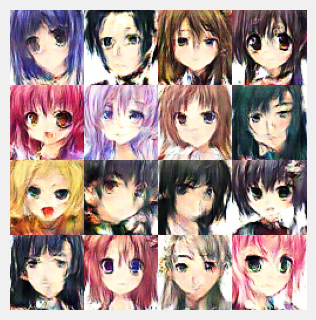

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 20/30 | Iter 48 /336 | D_loss -9.1055 | G_loss 9.3512 | Gradient_Penalty 0.8707 | Gradient_Norm 1.0751 | 
Epoch 20/30 | Iter 96 /336 | D_loss -9.3930 | G_loss 9.7610 | Gradient_Penalty 0.7085 | Gradient_Norm 1.0874 | 
Epoch 20/30 | Iter 144/336 | D_loss -9.0486 | G_loss 5.7806 | Gradient_Penalty 0.8649 | Gradient_Norm 1.0842 | 
Epoch 20/30 | Iter 192/336 | D_loss -8.7151 | G_loss 4.1564 | Gradient_Penalty 1.1557 | Gradient_Norm 1.0865 | 
Epoch 20/30 | Iter 240/336 | D_loss -9.0774 | G_loss 7.9029 | Gradient_Penalty 0.3587 | Gradient_Norm 1.0474 | 
Epoch 20/30 | Iter 288/336 | D_loss -8.5260 | G_loss 6.6528 | Gradient_Penalty 0.8433 | Gradient_Norm 1.0579 | 
Epoch 20/30 | Iter 336/336 | D_loss -9.6693 | G_loss 6.3445 | Gradient_Penalty 1.0561 | Gradient_Norm 1.0843 | 


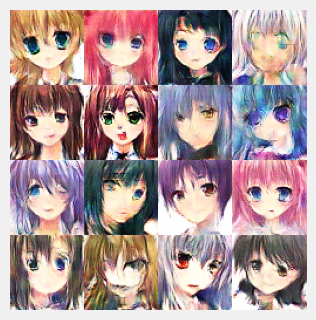

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 21/30 | Iter 48 /336 | D_loss -9.5951 | G_loss 7.1910 | Gradient_Penalty 1.1299 | Gradient_Norm 1.1006 | 
Epoch 21/30 | Iter 96 /336 | D_loss -9.1464 | G_loss 5.0637 | Gradient_Penalty 0.7654 | Gradient_Norm 1.0510 | 
Epoch 21/30 | Iter 144/336 | D_loss -9.0922 | G_loss 7.1037 | Gradient_Penalty 0.8841 | Gradient_Norm 1.0894 | 
Epoch 21/30 | Iter 192/336 | D_loss -9.0898 | G_loss 9.0847 | Gradient_Penalty 0.7478 | Gradient_Norm 1.0853 | 
Epoch 21/30 | Iter 240/336 | D_loss -8.4661 | G_loss 8.6372 | Gradient_Penalty 0.7035 | Gradient_Norm 1.0848 | 
Epoch 21/30 | Iter 288/336 | D_loss -9.0648 | G_loss 6.7843 | Gradient_Penalty 0.9557 | Gradient_Norm 1.0895 | 
Epoch 21/30 | Iter 336/336 | D_loss -8.9614 | G_loss 4.8185 | Gradient_Penalty 1.6003 | Gradient_Norm 1.1236 | 


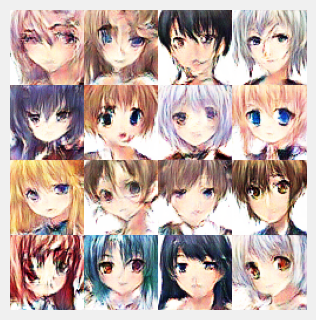

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 22/30 | Iter 48 /336 | D_loss -9.4947 | G_loss 7.6088 | Gradient_Penalty 1.7779 | Gradient_Norm 1.1372 | 
Epoch 22/30 | Iter 96 /336 | D_loss -9.4117 | G_loss 6.4625 | Gradient_Penalty 1.6277 | Gradient_Norm 1.1245 | 
Epoch 22/30 | Iter 144/336 | D_loss -9.6793 | G_loss 3.5176 | Gradient_Penalty 1.0230 | Gradient_Norm 1.1026 | 
Epoch 22/30 | Iter 192/336 | D_loss -9.3251 | G_loss 5.9235 | Gradient_Penalty 1.0699 | Gradient_Norm 1.0998 | 
Epoch 22/30 | Iter 240/336 | D_loss -8.8395 | G_loss 6.0303 | Gradient_Penalty 1.3893 | Gradient_Norm 1.1254 | 
Epoch 22/30 | Iter 288/336 | D_loss -8.8597 | G_loss 3.3528 | Gradient_Penalty 1.0718 | Gradient_Norm 1.0974 | 
Epoch 22/30 | Iter 336/336 | D_loss -8.8614 | G_loss 3.0217 | Gradient_Penalty 0.9889 | Gradient_Norm 1.0879 | 


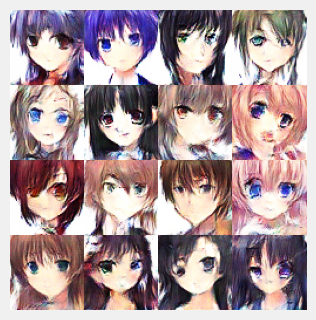

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 23/30 | Iter 48 /336 | D_loss -9.3226 | G_loss 8.7014 | Gradient_Penalty 1.3529 | Gradient_Norm 1.1122 | 
Epoch 23/30 | Iter 96 /336 | D_loss -9.3498 | G_loss 7.9278 | Gradient_Penalty 0.5898 | Gradient_Norm 1.0484 | 
Epoch 23/30 | Iter 144/336 | D_loss -9.7902 | G_loss 4.7730 | Gradient_Penalty 0.9881 | Gradient_Norm 1.0749 | 
Epoch 23/30 | Iter 192/336 | D_loss -9.2125 | G_loss 5.5224 | Gradient_Penalty 0.9353 | Gradient_Norm 1.0882 | 
Epoch 23/30 | Iter 240/336 | D_loss -8.6684 | G_loss 4.0303 | Gradient_Penalty 0.7417 | Gradient_Norm 1.0639 | 
Epoch 23/30 | Iter 288/336 | D_loss -9.5072 | G_loss 8.5793 | Gradient_Penalty 1.1742 | Gradient_Norm 1.0921 | 
Epoch 23/30 | Iter 336/336 | D_loss -7.8891 | G_loss 5.8900 | Gradient_Penalty 1.0430 | Gradient_Norm 1.0909 | 


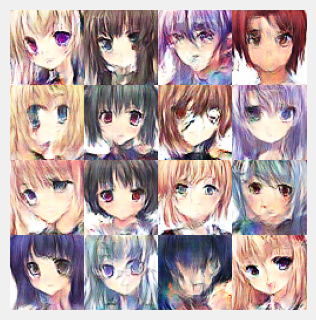

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 24/30 | Iter 48 /336 | D_loss -9.9085 | G_loss 8.8572 | Gradient_Penalty 1.1979 | Gradient_Norm 1.1195 | 
Epoch 24/30 | Iter 96 /336 | D_loss -10.3727 | G_loss 4.9900 | Gradient_Penalty 0.7918 | Gradient_Norm 1.0713 | 
Epoch 24/30 | Iter 144/336 | D_loss -9.5763 | G_loss 3.6583 | Gradient_Penalty 1.6736 | Gradient_Norm 1.1120 | 
Epoch 24/30 | Iter 192/336 | D_loss -9.5119 | G_loss 5.6041 | Gradient_Penalty 0.7009 | Gradient_Norm 1.0798 | 
Epoch 24/30 | Iter 240/336 | D_loss -9.5857 | G_loss 5.4503 | Gradient_Penalty 0.9322 | Gradient_Norm 1.0714 | 
Epoch 24/30 | Iter 288/336 | D_loss -9.2937 | G_loss 7.0049 | Gradient_Penalty 1.2126 | Gradient_Norm 1.1027 | 
Epoch 24/30 | Iter 336/336 | D_loss -9.6492 | G_loss 6.1149 | Gradient_Penalty 1.9760 | Gradient_Norm 1.1409 | 


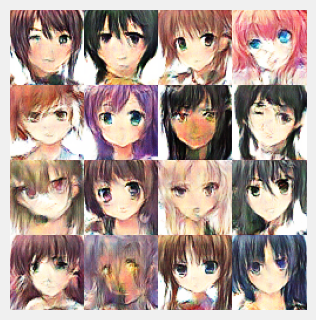

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 25/30 | Iter 48 /336 | D_loss -10.0528 | G_loss 6.2015 | Gradient_Penalty 1.1511 | Gradient_Norm 1.1112 | 
Epoch 25/30 | Iter 96 /336 | D_loss -9.5896 | G_loss 5.4378 | Gradient_Penalty 0.6875 | Gradient_Norm 1.0647 | 
Epoch 25/30 | Iter 144/336 | D_loss -8.5001 | G_loss 7.2233 | Gradient_Penalty 0.5201 | Gradient_Norm 1.0293 | 
Epoch 25/30 | Iter 192/336 | D_loss -9.6850 | G_loss 9.1038 | Gradient_Penalty 0.7277 | Gradient_Norm 1.0604 | 
Epoch 25/30 | Iter 240/336 | D_loss -8.8455 | G_loss 7.6890 | Gradient_Penalty 0.5322 | Gradient_Norm 1.0629 | 
Epoch 25/30 | Iter 288/336 | D_loss -10.3418 | G_loss 4.6703 | Gradient_Penalty 0.8522 | Gradient_Norm 1.0521 | 
Epoch 25/30 | Iter 336/336 | D_loss -8.7544 | G_loss 7.0041 | Gradient_Penalty 0.9268 | Gradient_Norm 1.0947 | 


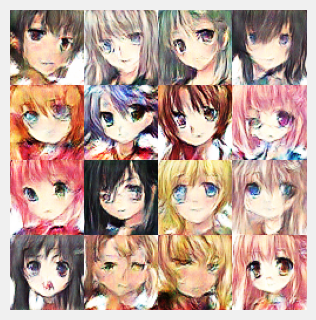

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 26/30 | Iter 48 /336 | D_loss -9.9356 | G_loss 9.5638 | Gradient_Penalty 1.0952 | Gradient_Norm 1.0946 | 
Epoch 26/30 | Iter 96 /336 | D_loss -9.1673 | G_loss 12.2717 | Gradient_Penalty 0.4978 | Gradient_Norm 1.0644 | 
Epoch 26/30 | Iter 144/336 | D_loss -8.8314 | G_loss 7.1643 | Gradient_Penalty 0.4495 | Gradient_Norm 1.0424 | 
Epoch 26/30 | Iter 192/336 | D_loss -9.1228 | G_loss 6.3846 | Gradient_Penalty 0.8274 | Gradient_Norm 1.0800 | 
Epoch 26/30 | Iter 240/336 | D_loss -9.4855 | G_loss 4.2566 | Gradient_Penalty 1.0033 | Gradient_Norm 1.1005 | 
Epoch 26/30 | Iter 288/336 | D_loss -9.4681 | G_loss 8.6773 | Gradient_Penalty 1.0165 | Gradient_Norm 1.1087 | 
Epoch 26/30 | Iter 336/336 | D_loss -9.4927 | G_loss 4.9798 | Gradient_Penalty 0.7077 | Gradient_Norm 1.0295 | 


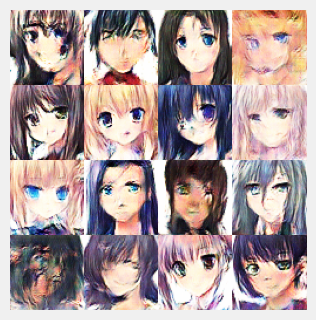

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 27/30 | Iter 48 /336 | D_loss -9.9070 | G_loss 6.7040 | Gradient_Penalty 0.4587 | Gradient_Norm 1.0397 | 
Epoch 27/30 | Iter 96 /336 | D_loss -9.5581 | G_loss 10.4069 | Gradient_Penalty 0.6823 | Gradient_Norm 1.0605 | 
Epoch 27/30 | Iter 144/336 | D_loss -10.3342 | G_loss 9.1808 | Gradient_Penalty 0.9486 | Gradient_Norm 1.0848 | 
Epoch 27/30 | Iter 192/336 | D_loss -9.1559 | G_loss 4.5542 | Gradient_Penalty 0.4537 | Gradient_Norm 1.0336 | 
Epoch 27/30 | Iter 240/336 | D_loss -9.0697 | G_loss 11.6958 | Gradient_Penalty 0.8646 | Gradient_Norm 1.0823 | 
Epoch 27/30 | Iter 288/336 | D_loss -9.5317 | G_loss 7.0550 | Gradient_Penalty 1.0776 | Gradient_Norm 1.0986 | 
Epoch 27/30 | Iter 336/336 | D_loss -9.2854 | G_loss 7.9475 | Gradient_Penalty 0.9205 | Gradient_Norm 1.0967 | 


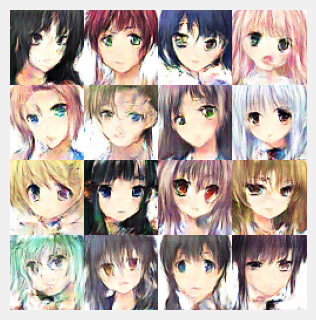

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 28/30 | Iter 48 /336 | D_loss -9.6443 | G_loss 8.5990 | Gradient_Penalty 0.8327 | Gradient_Norm 1.0683 | 
Epoch 28/30 | Iter 96 /336 | D_loss -11.1342 | G_loss 6.1432 | Gradient_Penalty 2.7071 | Gradient_Norm 1.1442 | 
Epoch 28/30 | Iter 144/336 | D_loss -8.7657 | G_loss 6.8150 | Gradient_Penalty 1.1233 | Gradient_Norm 1.0964 | 
Epoch 28/30 | Iter 192/336 | D_loss -9.3293 | G_loss 6.7819 | Gradient_Penalty 0.7950 | Gradient_Norm 1.0788 | 
Epoch 28/30 | Iter 240/336 | D_loss -10.2953 | G_loss 9.0332 | Gradient_Penalty 1.4836 | Gradient_Norm 1.1090 | 
Epoch 28/30 | Iter 288/336 | D_loss -8.0444 | G_loss 7.8432 | Gradient_Penalty 1.4667 | Gradient_Norm 1.1108 | 
Epoch 28/30 | Iter 336/336 | D_loss -9.8155 | G_loss 6.2876 | Gradient_Penalty 0.7990 | Gradient_Norm 1.0920 | 


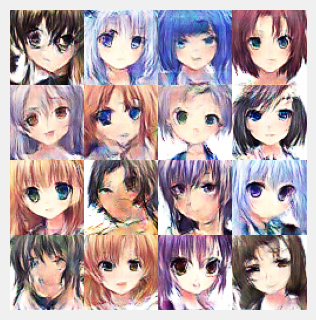

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 29/30 | Iter 48 /336 | D_loss -9.5746 | G_loss 8.2226 | Gradient_Penalty 1.0881 | Gradient_Norm 1.0993 | 
Epoch 29/30 | Iter 96 /336 | D_loss -8.8297 | G_loss 8.0774 | Gradient_Penalty 0.8488 | Gradient_Norm 1.0760 | 
Epoch 29/30 | Iter 144/336 | D_loss -9.4267 | G_loss 7.7933 | Gradient_Penalty 1.2242 | Gradient_Norm 1.1080 | 
Epoch 29/30 | Iter 192/336 | D_loss -9.6098 | G_loss 7.3930 | Gradient_Penalty 1.7928 | Gradient_Norm 1.1124 | 
Epoch 29/30 | Iter 240/336 | D_loss -10.2602 | G_loss 5.7056 | Gradient_Penalty 0.9599 | Gradient_Norm 1.0851 | 
Epoch 29/30 | Iter 288/336 | D_loss -10.5802 | G_loss 6.7900 | Gradient_Penalty 1.1743 | Gradient_Norm 1.0933 | 
Epoch 29/30 | Iter 336/336 | D_loss -9.5566 | G_loss 7.1985 | Gradient_Penalty 1.3058 | Gradient_Norm 1.1090 | 


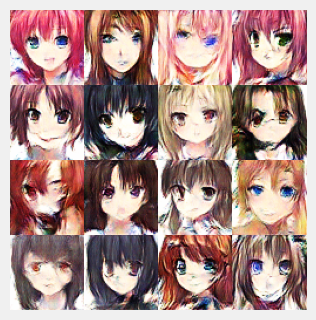

  0%|          | 0/336 [00:00<?, ?it/s]

Epoch 30/30 | Iter 48 /336 | D_loss -9.9389 | G_loss 7.9293 | Gradient_Penalty 1.3973 | Gradient_Norm 1.1261 | 
Epoch 30/30 | Iter 96 /336 | D_loss -9.2156 | G_loss 12.6779 | Gradient_Penalty 0.7011 | Gradient_Norm 1.0574 | 
Epoch 30/30 | Iter 144/336 | D_loss -9.0850 | G_loss 7.5959 | Gradient_Penalty 0.9038 | Gradient_Norm 1.0873 | 
Epoch 30/30 | Iter 192/336 | D_loss -9.2899 | G_loss 9.3501 | Gradient_Penalty 1.8505 | Gradient_Norm 1.1370 | 
Epoch 30/30 | Iter 240/336 | D_loss -9.8172 | G_loss 7.4294 | Gradient_Penalty 0.9454 | Gradient_Norm 1.0642 | 
Epoch 30/30 | Iter 288/336 | D_loss -8.3081 | G_loss 9.4781 | Gradient_Penalty 1.8969 | Gradient_Norm 1.1123 | 
Epoch 30/30 | Iter 336/336 | D_loss -8.7198 | G_loss 8.7400 | Gradient_Penalty 1.5222 | Gradient_Norm 1.1157 | 


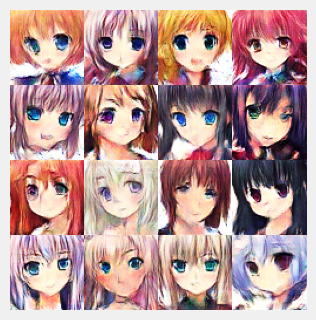

In [57]:
epochs = 30

print_every = 48
n_disc = 3

G_loss = []
D_loss = []
Grad_pen = []
Grad_norm = []

fixed_z = torch.randn(16, latent_dim, device=device)

for epoch in tqdm(range(epochs)):
    generator.train()
    discriminator.train()
    for i, (images, _) in tqdm(enumerate(loader), total=len(loader)):
        images = images.to(device)
        
        # Discriminator Train
        for _ in range(n_disc):
            z = torch.randn(batch_size, latent_dim, device=device)
            fake_imgs = generator(z).detach()
    
            d_true = discriminator(images)
            d_fake = discriminator(fake_imgs)
    
            gp, gn = gradient_penalty_loss(images.detach(), fake_imgs.detach(), discriminator, gp_weight)
    
            D_optimizer.zero_grad()
            d_loss = d_fake.mean() - d_true.mean() + gp
            d_loss.backward()
            D_optimizer.step()
        
        # Generator Train
        z = torch.randn(batch_size, latent_dim, device=device)
        fake_imgs = generator(z)

        d_fake = discriminator(fake_imgs)

        G_optimizer.zero_grad()
        g_loss = -d_fake.mean()
        g_loss.backward()
        G_optimizer.step()

        # Record Logs
        G_loss.append(g_loss.item())
        D_loss.append(d_loss.item())
        Grad_pen.append(gp.item())
        Grad_norm.append(gn.item())
        
        if (i+1)%print_every == 0:
            print(f"Epoch {epoch+1}/{epochs} | ", end="")
            print(f"Iter {i+1:<3}/{len(loader)} | ", end="")
            print(f"D_loss {d_loss.item():.4f} | ", end="")
            print(f"G_loss {g_loss.item():.4f} | ", end="")
            print(f"Gradient_Penalty {gp.item():.4f} | ", end="")
            print(f"Gradient_Norm {gn.item():.4f} | ")

            generator.eval()
            discriminator.eval()
        
            with torch.no_grad():
                generated = generator(fixed_z).cpu()
        
            generated = (generated + 1)/2
            generated = generated.clamp(0,1)
        
            fig, axes = plt.subplots(4,4, figsize=(3,3))
            for idx, ax in enumerate(axes.flatten()):
                img = generated[idx]
                ax.imshow(img.permute(1,2,0))
                ax.axis(False)
                
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.tight_layout(pad=0)
            plt.savefig(f"/kaggle/working/progress/qplot_{epoch+1}_{i+1}.png", dpi=100)
            plt.close(fig)
    
    generator.eval()
    discriminator.eval()
    
    with torch.no_grad():
        z = torch.randn(16, latent_dim, device=device)
        generated = generator(z).cpu()
        
        generated = (generated + 1)/2
        generated = generated.clamp(0,1)
    
        fig, axes = plt.subplots(4,4, figsize=(3,3))
        for i, ax in enumerate(axes.flatten()):
            img = generated[i]
            ax.imshow(img.permute(1,2,0))
            ax.axis(False)
            
        plt.subplots_adjust(wspace=0, hspace=0)
        plt.tight_layout(pad=0)
        plt.show()

G_loss_total += G_loss
D_loss_total += D_loss
Grad_pen_total += Grad_pen
Grad_norm_total += Grad_norm

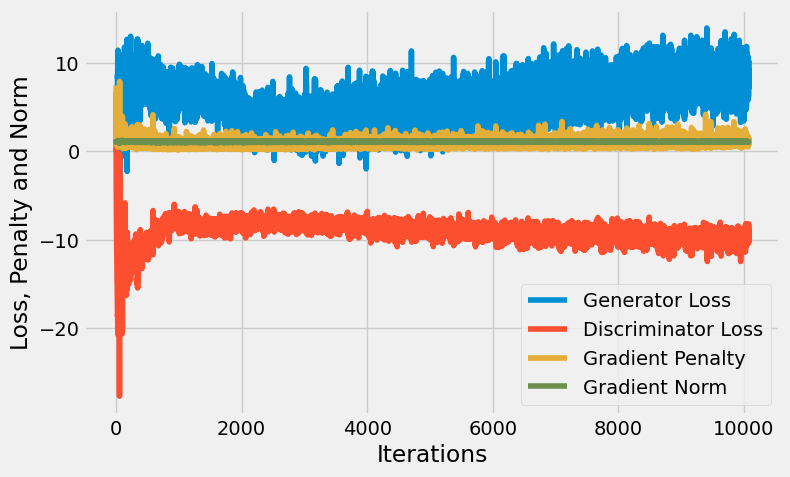

In [58]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(8,5))
plt.plot(G_loss_total, label = "Generator Loss")
plt.plot(D_loss_total, label = "Discriminator Loss")
plt.plot(Grad_pen_total, label = "Gradient Penalty")
plt.plot(Grad_norm_total, label = "Gradient Norm")
plt.xlabel("Iterations")
plt.ylabel("Loss, Penalty and Norm")
plt.legend()
plt.show()

In [59]:
import shutil

shutil.make_archive("flower_plots", "zip", "/kaggle/working/progress")

'/kaggle/working/flower_plots.zip'

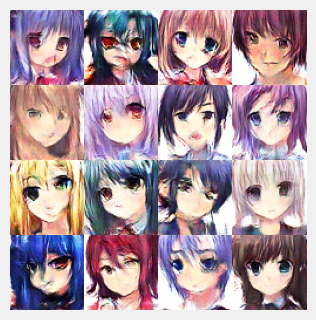

In [64]:
generator.eval()
discriminator.eval()

with torch.no_grad():
    z = torch.randn(16, latent_dim, device=device)
    generated = generator(z).cpu()

generated = (generated + 1)/2
generated = generated.clamp(0,1)

fig, axes = plt.subplots(4,4, figsize=(3,3))
for i, ax in enumerate(axes.flatten()):
    img = generated[i]
    ax.imshow(img.permute(1,2,0))
    ax.axis(False)
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(pad=0)
plt.show()

In [63]:
shutil.rmtree("/kaggle/working/progress")
os.remove("/kaggle/working/flower_plots.zip")